In [1]:
import clip
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from diffusers import StableDiffusionImg2ImgPipeline
from diffusers.models import AutoencoderKL
from ModelDefinitions import Voxel2StableDiffusionModel
from transformers import BlipProcessor,BlipForConditionalGeneration
from utils import load_image, to_PIL, transform, decode_img
from ROIMaskGen import GetROI
from torchvision import transforms
import warnings
warnings.filterwarnings('ignore')

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-L/14", device=device)
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(device)
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
modelGeneration = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large", torch_dtype=torch.float16).to(device)
sdPipe = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",torch_dtype=torch.float16).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [3]:
def GetPredictions(target_idx):
    sample_preds = []
    # Load models for bagging
    # Here, we choose model 92, 94, 97, 100 since they have better performance
    model_paths = ['./Models/92/199', './Models/94/199', './Models/97/199', './Models/100/199']
    select_ROIs = [3, 1, 3, 3]
    
    # target_idx = 21
    image_path = f'./dataset/subj01/training_split/training_images/{target_idx}.png'
    target_image = transform(load_image(image_path))
    voxel2sd = Voxel2StableDiffusionModel().to(device)
    
    for i in range(4):    
        voxel2sd.load_state_dict(torch.load(model_paths[i])['model_state_dict'])
        voxel2sd.eval()
    
        target_ROI = torch.from_numpy(GetROI(target_idx, select_ROIs[i])).to(device).float()
        latent = voxel2sd(target_ROI.reshape(1, -1))
        
        del target_ROI
        
        latentImg = to_PIL(decode_img(latent, vae)[0])
    
        del latent
        
        out = transforms.functional.pil_to_tensor(transforms.Resize((384,384))(latentImg)).to(device)
        out = modelGeneration.generate(out.unsqueeze(0)).to(device)
        prompt = processor.decode(out[0], skip_special_tokens=True).replace('blurry ', '')
    
        del out
        
        print(prompt)
        latentImg.show()
        # latentImg.save(f"./outputImg/low_{count}.png")
        retrieveImg = sdPipe(prompt=prompt, image=latentImg,strength=0.75, guidance_scale=6).images[0]
        retrieveImg.show()
        sample_preds.append(retrieveImg)
    return sample_preds, target_image

In [4]:
def project_to_CLIP(image):
    with torch.no_grad():
        #把每個model predict的images for a specific sample都投射到clip space
        #每個image會有投射完的features
        image = preprocess(image).unsqueeze(0).to(device)
        features = model.encode_image(image)
    return features

In [5]:
def aggregate_calculation(sample_features):
  aggregate_features = torch.stack(sample_features, 1)[0].mean(dim=0)
  #print(f'mean features: {aggregate_features}')
  return aggregate_features

In [6]:
def similarity(image1_features, image2_features):
    cos = torch.nn.CosineSimilarity(dim=0)
    return cos(image1_features,image2_features).item()

In [9]:
# 考慮到記憶體用量，我們只會一次處理一筆輸入，因此這裡的形狀不會是原本的 m x n，而單純是 m
def CLIP_bagging(sample_preds):
    best_similarity = 0
    best_image_index = -1
    sims = []
    
    #project images onto clip space
    sample_feature_vectors = [] #照片轉成feature vectors
    for sample in sample_preds:
        sample_feature_vectors.append(project_to_CLIP(sample))
        
    #find the mean feature vector
    # sample_aggregate_features = []
    agf = aggregate_calculation(sample_feature_vectors)
    
    #compare each image's feature vector with the mean feature vector
    #select the feature vector closest to the mean feature vector
    for i, features in enumerate(sample_feature_vectors):
        sim = similarity(agf, features[0])
        sims.append(sim)
        if sim > best_similarity:
            best_similarity = sim
            best_image_index = i
    
    #to visualize the best image for each testing data
    best_image = sample_preds[best_image_index]
    print(f'sims: {sims}')
    return best_image

white paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


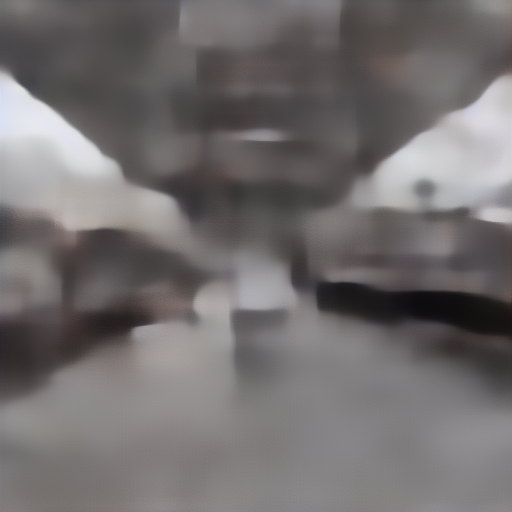

  0%|          | 0/37 [00:00<?, ?it/s]

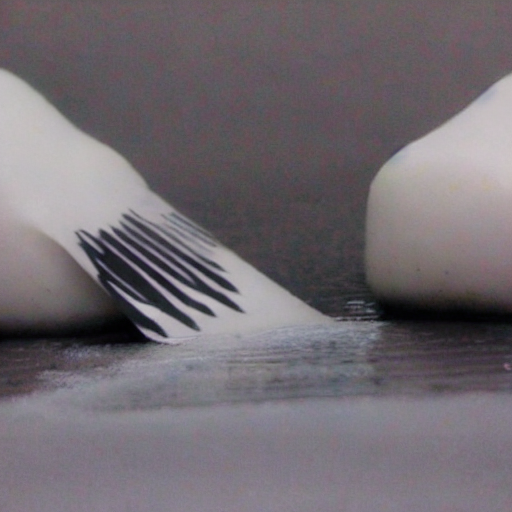

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


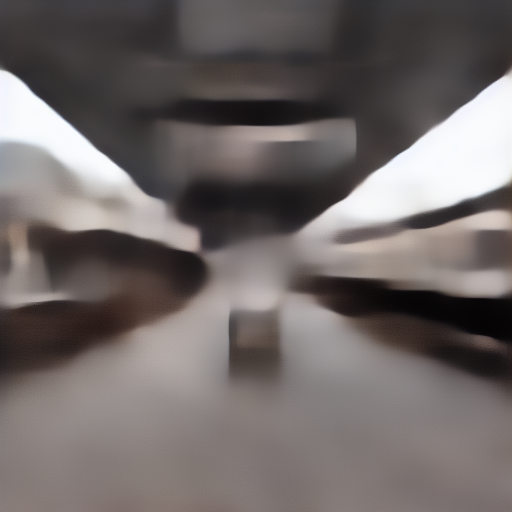

  0%|          | 0/37 [00:00<?, ?it/s]

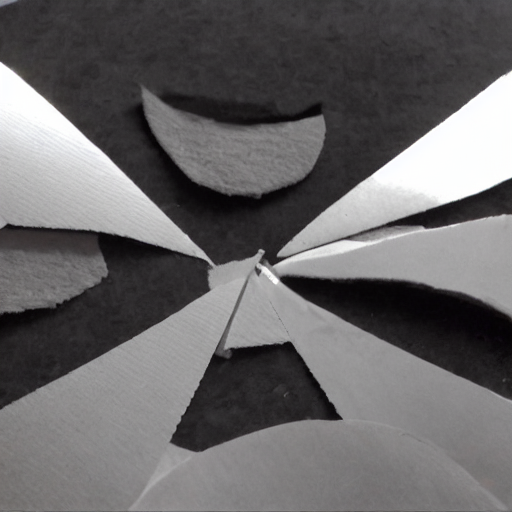

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


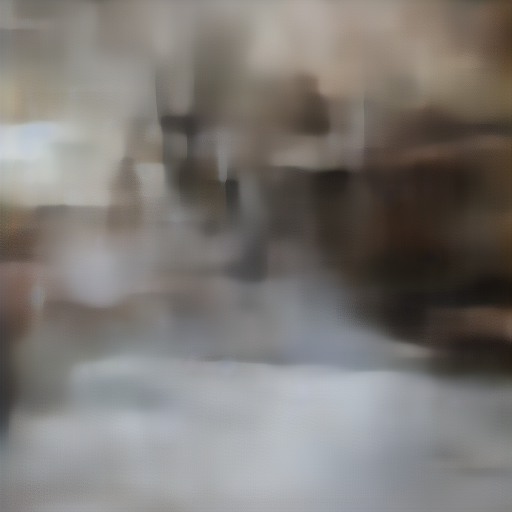

  0%|          | 0/37 [00:00<?, ?it/s]

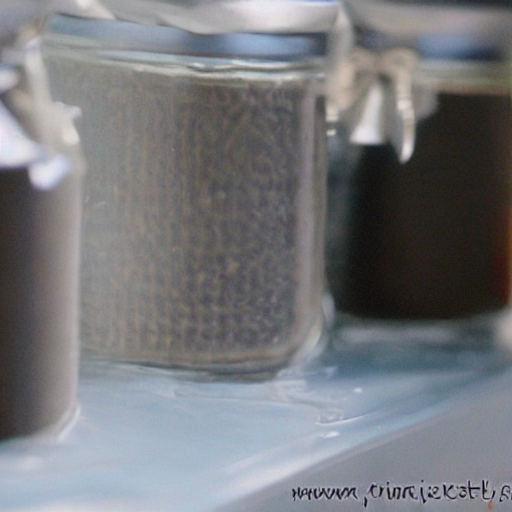

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


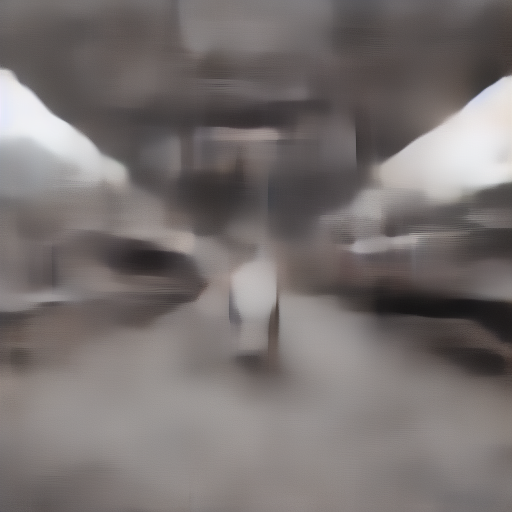

  0%|          | 0/37 [00:00<?, ?it/s]

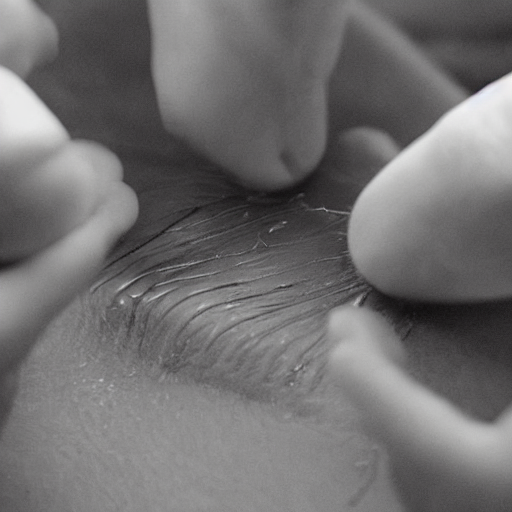

__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
sims: [0.89306640625, 0.9052734375, 0.84326171875, 0.8740234375]


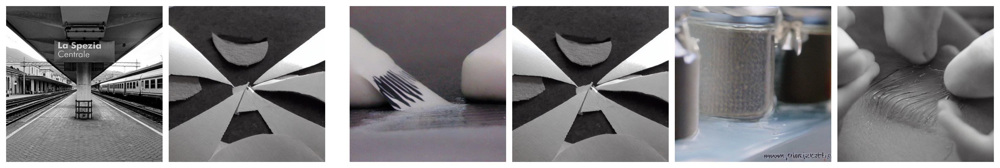

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


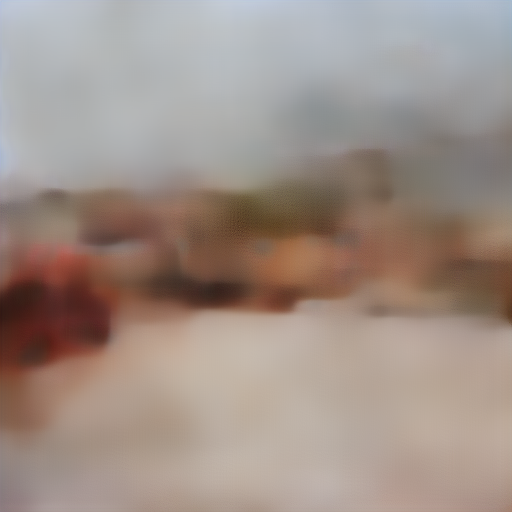

  0%|          | 0/37 [00:00<?, ?it/s]

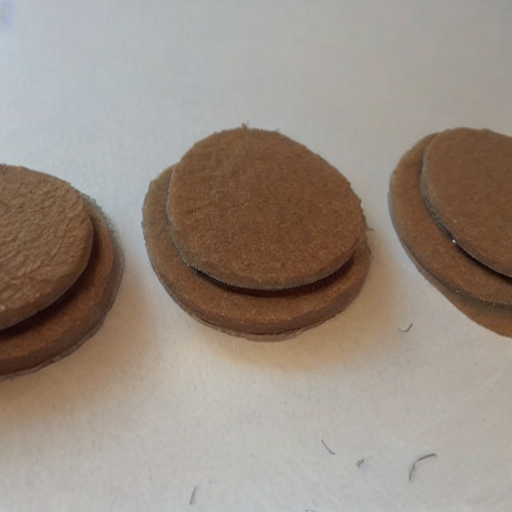

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


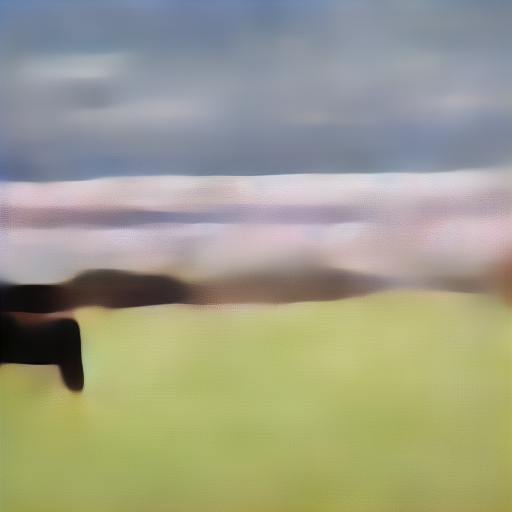

  0%|          | 0/37 [00:00<?, ?it/s]

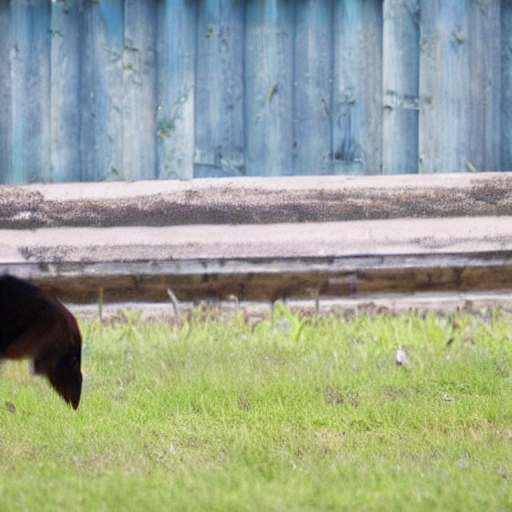

a white white paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


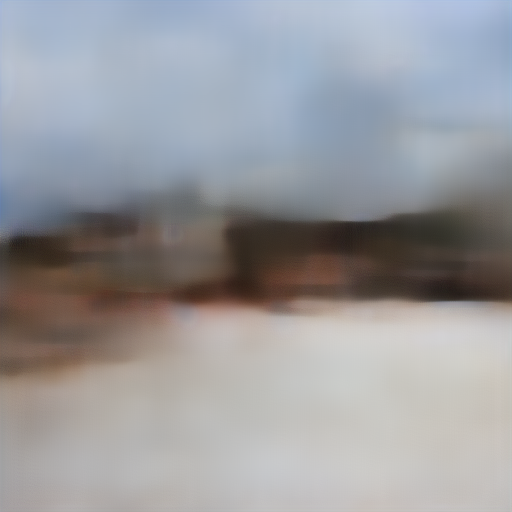

  0%|          | 0/37 [00:00<?, ?it/s]

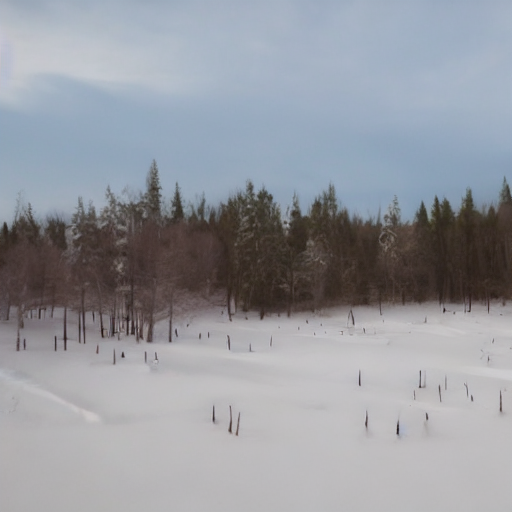

a paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste paste


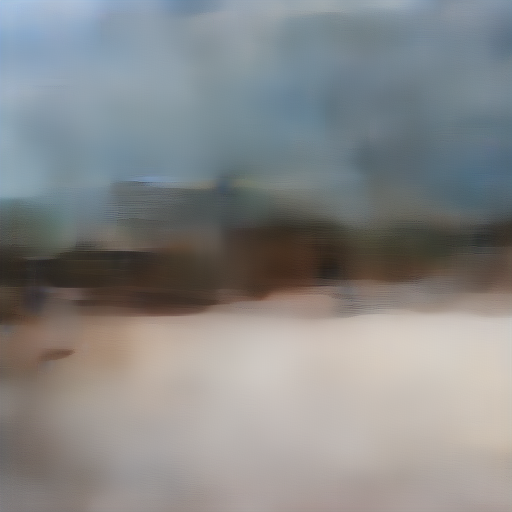

  0%|          | 0/37 [00:00<?, ?it/s]

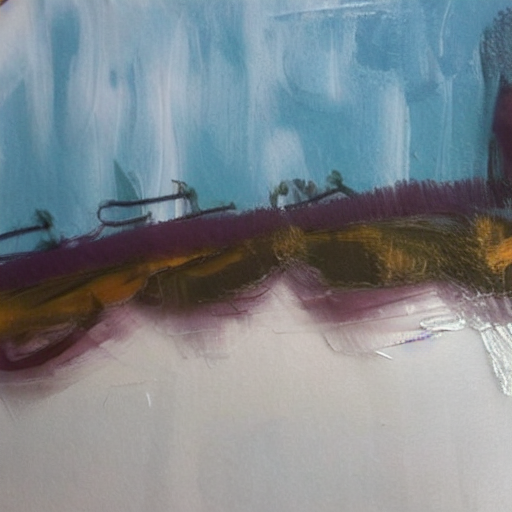

__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
__ torch.Size([768]) torch.Size([1, 768])
sims: [0.8095703125, 0.85986328125, 0.87646484375, 0.888671875]


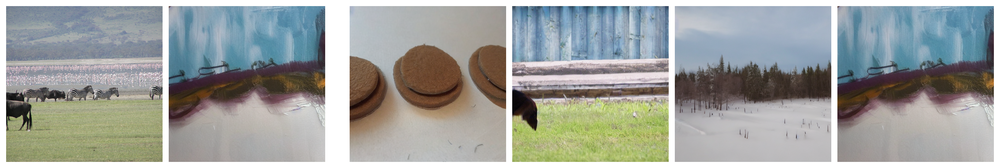

a - - spring spring spring spring spring spring spring spring spring spring spring spring spring spring spring spring


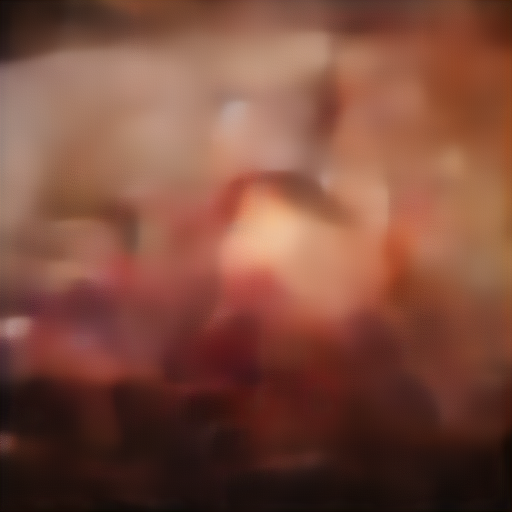

  0%|          | 0/37 [00:00<?, ?it/s]

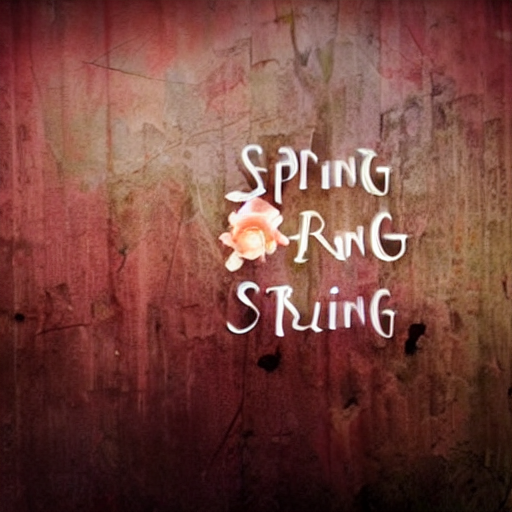

a - - - - spring spring spring spring spring spring spring spring spring spring spring spring spring spring


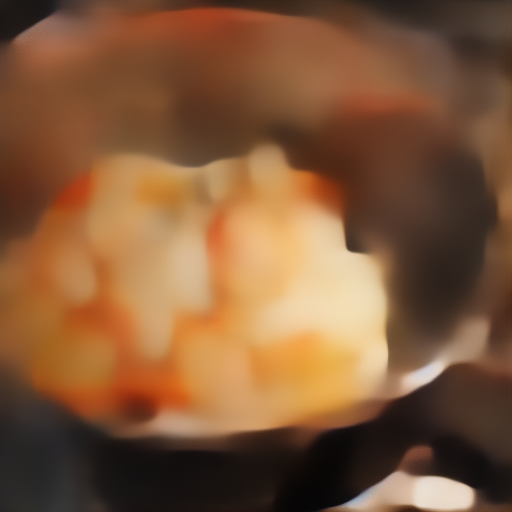

  0%|          | 0/37 [00:00<?, ?it/s]

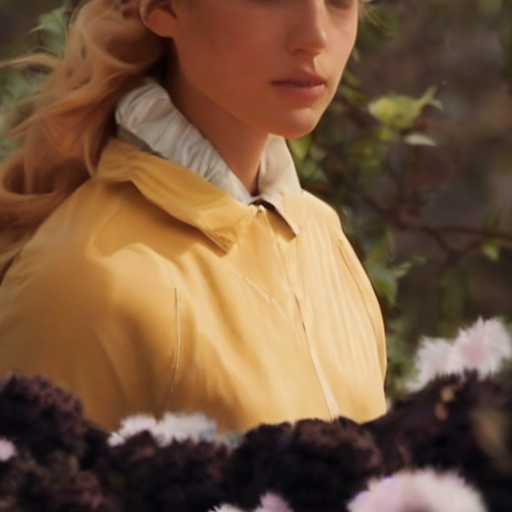

In [ ]:
for i in range(30, 51):
    # 設定要看哪一筆資料，這裡只會看 Training Set (也就是訓練期間的 train 和 validation)
    sample_preds, target_image = GetPredictions(i)
    best_image = CLIP_bagging(sample_preds)
    
    # best_image.show()
    from PIL import ImageOps
    bg = Image.new('RGB', (3272, 552), '#ffffff')
    target_image_ = ImageOps.expand(to_PIL(target_image[0]), 20, (255, 255, 255))
    best_image_ = ImageOps.expand(best_image, 20, (255, 255, 255))
    
    bg.paste(target_image_, (0, 0))
    bg.paste(best_image_, (20+512, 0))
    for j in range(4):
        pred_image = sample_preds[j]
        pred_image = ImageOps.expand(pred_image, 20, (255, 255, 255)) 
        bg.paste(pred_image, (20+512+20+512+20+40 + (512+20)*j, 0))
    bg.show()
    bg.save(f'result/result_{i}.png')

In [ ]:
# from PIL import ImageOps
# bg = Image.new('RGB', (3272, 552), '#ffffff')
# target_image_ = ImageOps.expand(to_PIL(target_image[0]), 20, (255, 255, 255))
# best_image_ = ImageOps.expand(best_image, 20, (255, 255, 255))

# bg.paste(target_image_, (0, 0))
# bg.paste(best_image_, (20+512, 0))
# for i in range(4):
#     pred_image = sample_preds[i]
#     pred_image = ImageOps.expand(pred_image, 20, (255, 255, 255)) 
#     bg.paste(pred_image, (20+512+20+512+20+40 + (512+20)*i, 0))
# bg.show()
# bg.save('result_1003.png')